<a href="https://colab.research.google.com/github/cabelotaina/COVID-19-TweetIDs/blob/master/webmining_final_countdown.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Analisis de sentimiento \#COVID19

En este trabajo haremos varios enfoques para proponer un análisis del sentimiento de los tweets de Covid 19 (coronavirus), en un primero enfoque hacemos un analisis de sentimentalidad de la palabra Lockdown. Y algunos mapeos sobre los datos de Covid 19 tambien con el uso de analisis de sentimentalidad.

El lockdown que estamos experimentando es un momento importante en la historia, donde varias familias fueron restringidas de ir a las calles para salvar vidas, se usaron varios argumentos para explicar a la población por qué quedarse en casa es lo correcto. Una de ellas es allanar la curva de desarrollo del virus. Esto significa que los sistemas de salud públicos o privados no están agotados y que pueden atender a todos para evitar muertes debido a la insuficiencia de recursos hospitalarios.

## Tweets

Tan pronto como buscamos información sobre cómo obtener los tweets y encontramos varios investigadores que siguieron la reacción pública en las redes sociales, por diferentes razones, contra el coronavirus, elegimos uno que parece más completo y utilizado por varios estudios, la fuente fue publicada en la página de [IEEE (Instituto de Ingenieros Eléctricos y Electrónicos)](https://ieee-dataport.org/open-access/coronavirus-covid-19-tweets-dataset). Los tweets utilizados se obtuvieron de los identificadores proporcionados en el siguiente [repositorio git](https://github.com/echen102/COVID-19-TweetIDs/), y principalmente en el trabajo de [Rabindra Lamsal](https://live.rlamsal.com.np)

## Como hemos bajado los tweets

Descargamos la cantidad máxima de tweets puestos a disposición por el investigador Rabindra Lamsal, la búsqueda sólo proporciona los identificadores de los tweets, debido a la política de uso de Twitter, descargamos el proyecto que está disponible en [Github](https://github.com/echen102/COVID-19-TweetIDs), durante varias semanas, siendo posible obtener solo los meses de [enero](https://drive.google.com/drive/folders/1AomRi8zfmszlUH0QbPWxgCEc-loNxP-6?usp=sharing), [febrero](https://drive.google.com/drive/folders/1Pc4Zw3-vaIy72CYhUhquEg8oc2J7hcny?usp=sharing) y [mayo](https://drive.google.com/drive/folders/1DVfDJy8bFvU719W04wuFKGRPMGNqKF_n?usp=sharing) de 2020.

Para hidratar los tweets hemos utilizado la herramienta [twarc](https://github.com/DocNow/twarc) en un entorno Docker hemos configurado un container.

El entorno, para la obtención de la información relacionada a la hidratación de los tweets del Covid 19, usando twarc, ha sido generado usando un contenedor (Docker), debido a que en distintas plataformas (Windows y MacOS), se ha tenido problemas para su Instalación.

Para la creación y ejecución de nuestro docker se ha ejecutado lo siguiente:

```
docker pull ubuntu
docker run -it -v /Users/COVID-19-TweetIDs:/root ubuntu:latest
```



Descargamos nuestra imagen de ubuntu y la ejecutamos agregando un volumen local donde se hidrataron nuestros tweets.

Una vez dentro de nuestro docker instalamos nuestras dependencias para usar twarc y esperamos a que nuestro artefacto .py hidrate nuestros tweets.

```
apt-get update; apt-get install python3; apt-get install python3-pip
pip3 install twarc
pip3 install tqdm
twarc configure

Twarc needs to know a few things before it can talk to Twitter on your behalf.

Please enter your Twitter application credentials from apps.twitter.com:

consumer key: *************(REPLACE WITH VALUES)
consumer secret: *********** (REPLACE WITH VALUES)

✨ ✨ ✨  Happy twarcing! ✨ ✨ ✨

python3 hydrate.py
hydrating 2020-01/coronavirus-tweet-id-2020-01-27-22.txt
 44%|████████████████████████████████████████████████████████████
```

Após el termino del download algunos archivos no estaban funcionando (cuatro archivos) y hemos tenido que removelos, lo que es normal, por ejemplo ni todos los identificadores fueran hidratados ya que algunos los usuarios ya lo han removido.


## Montando el sistema de arquivos

Para usar los arquivos que hemos bajado hemos disponibilizado ellos en google drive, dado que los arquivos llegan a mas de 10 GB por mês. Por eso tenemos que montar el sistema de arquivos en esta instancia de colab.

In [0]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Importando las librerias

Utilizamos pandas para los detaframes, numpy para manejar los datos, TextBlob para la analise de sentimiento, WordCloud para crear el nube de tagas, regular expression para limpiar los tweets y obtener los usuarios y hashtags, Counter para contar la frequencia de palabras utilizada en las nubes de palabras, matprotlib  para hacer graficas, folium para cargar los mapas, gensin para remover las stop words. Hay algunas otras librerias que utilizamos que no estan aqui y que aparecem en el momento que las vamos utilizar como BaseMap que permite hacer un mapa de sentimentos con enfoque em España para cada uno de los meses que tenemos.

In [0]:
import pandas as pd
import numpy as np
from textblob import TextBlob
from wordcloud import WordCloud
import re
from collections import Counter
import matplotlib.pyplot as plt
import folium
import gensim 

## Manejo de tweets

A continuación importamos los tweets de cada mes, enero, febrero y marzo.

In [0]:
df_01 = pd.read_csv(r"drive/My Drive/UAM/web-mining/final-project/2020-01/lockdown.csv", encoding='utf-8', names=['Tweets'], header=None)
df_02 = pd.read_csv(r"drive/My Drive/UAM/web-mining/final-project/2020-02/lockdown.csv", encoding='utf-8', names=['Tweets'], header=None)
df_03 = pd.read_csv(r"drive/My Drive/UAM/web-mining/final-project/2020-03/lockdown.csv", encoding='utf-8', names=['Tweets'], header=None)

df = pd.concat([df_01, df_02, df_03])

tweets = df["Tweets"] # getting only tweets for wordcloud and fastText analisis

## Limpiando

Tanto para **entrenar la red neuronal** como para **crear una nube de palabras** necesitamos eliminar caracteres no deseados, separar hashtags, identificadores de usuario, eliminar palabras inútiles, codificar el texto en el formato correcto, eliminar enlaces:

In [0]:
text = ' '.join(set(tweets)) # join all tweets
text = gensim.parsing.preprocessing.remove_stopwords(text) # removing stop words
text = text.encode("utf-8").decode("utf-8") # text decode
text = re.sub(r'http\S+', '', text) # removing URLs
text = re.sub(r'RT', '', text) # removing retweet mark
text = ''.join([char for char in text if char not in '!"$%&\'()*+,-./:;<=>?[\\]^_`{|}~']) # removing puntuation

In [0]:
hashtags = re.findall(r"#(\w+)", text) # copy hashtags
text = re.sub(r"#(\w+)", '', text) # removing hashtags
users = re.findall(r"@(\w+)", text) # copy users
text = re.sub(r"@(\w+)", '', text) # removing users
text = re.sub(r'\b[0-9]+\b\s*', '', text) # removing only numbers 12435 not corona2020

text = text.lower() # change all data to lower case

In [0]:
f = open("tweets", "a")
f.write(text)
f.close()

In [0]:
text[0:100]

' i hope youre correct but china worlds second largest economy nominal gdp trillion lockdown it doesn'

El resultado es una string con todas las palabras que necessitamos para entrenar la rede neuronal y para para hacer la nube de palabras. Que ponemos en `text`

## Análisis de texto no supervisada

Utilizamos el software [fastText](https://fasttext.cc/docs/en/unsupervised-tutorial.html) para realizar el análisis no supervisado, podriamos utilizar cbow (continuous bag of words) o skipgram, este ultimos es considerado mejor ya que obtiene mas información de contexto, y es el padrón de fastText.

## Instalando y importando la libreria

In [0]:
!pip install fasttext
import fasttext

## Entrenando el modelo

Aqui suministramos el archivo con todos las palabras que encontramos en los tweets.


In [0]:
model = fasttext.train_unsupervised("tweets")

## Palabras vecinas

Para ver cuales palabras son mas cercanas a algunas que vamos escoger podemos usar el metodo `get_nearest_neighbors`, algunas de las palabras que hemos testado son:

*   coronavirus
*   covid19
*   spain
*   españa
*   lockdown
*   china
*   usa
*   EEUU
*   virus

Escojemos de estas palabras algunas para describir su funcionamiento. La función abajo es para facilitar la impresión de las palabras sin el coeficiente de proximidad.

In [0]:
def get(word):
  print(word+": ")
  for index, item in model.get_nearest_neighbors(word):
    print(item)

Podemos ver que lockdown es una de las palabras mas cercana.

In [0]:
get("coronavirus")

coronavirus: 
coronavirushit
coronavirusn
coronavirusu00a0case
coronavirusravaged
coronavirusnn
coronavirusu00a0lockdown
describes
u00a0afp
coronovirus
described


Interessante que para espanha tenemos la palabra *espalhar* y *espalhou* em portugues que significa propagar. Dado que el mes de marzo hubo incremento de los casos de corona virus en España.

In [0]:
get("españa")

españa: 
football
glimpse
cc
brexit
cgtns
retweet
benefits
40m
cn
draw


Lockdown y coronavirus estan muy relacionadas pero aparecen palabras como Wuhan, ciudad de donde el primer brote del virus fue encontrada. 

In [0]:
get("lockdown")

lockdown: 
lockdownnby
lockdownnnon
lockdownn2
lockdownnpeople
lockdownnthere
lockdownnn70000
lockdownnnchina
lockdownnn
lockdowned
lockdownnnphoto


##Nuvem de palavras

In [0]:
def cloud(text):
  counter = Counter([ x for x in text.split() if len(x) > 3]).most_common(100)
  result = {}
  for w in counter:
    label = str(TextBlob(w[0]).correct())
    result[label] = w[1]

  wordCloud = WordCloud(width=1600, height=800).fit_words(result)
  fig, ax = plt.subplots(figsize=(16,8))
  plt.axis('off')          
  plt.imshow(wordCloud)

La nube de palabras reune las palabras mas utilizadas durante el desarrollo del coronavirus durante los meses de Enero, Febrero y Marzo hemos apenas pilado los tweets que possuem la palabra lockdown:

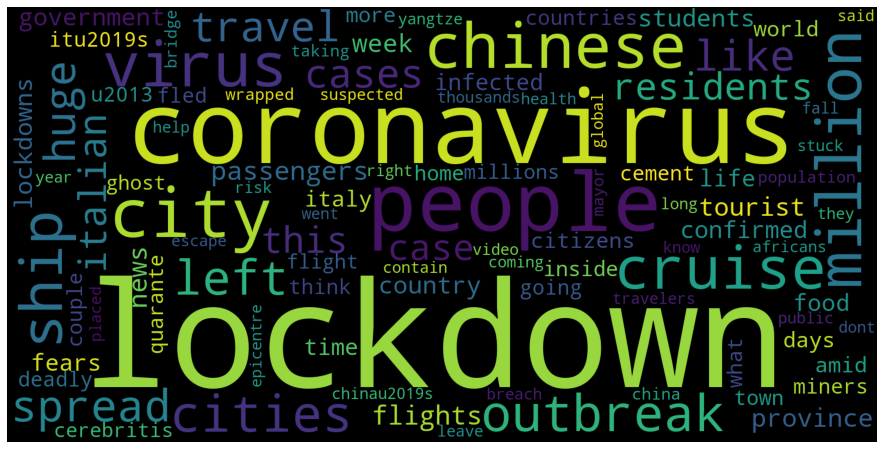

In [0]:
cloud(text)

Destos tweets hemos separado los usuarios que participan:

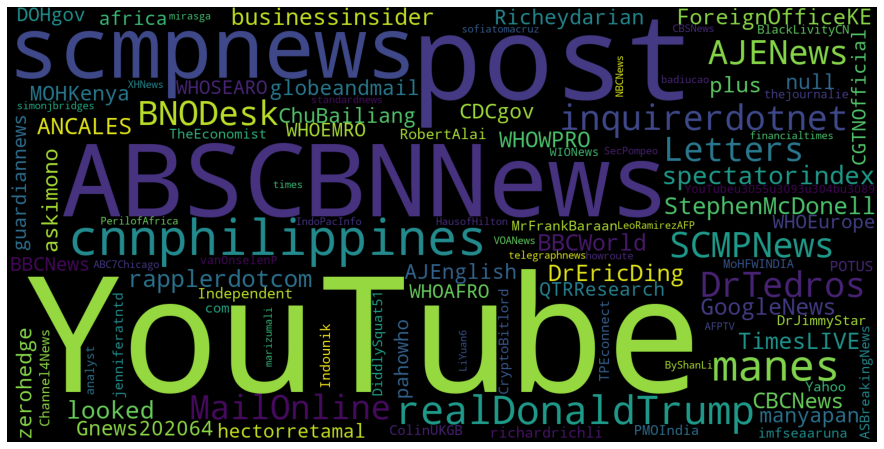

In [0]:
cloud(" ".join(users))

Y las hashtags:

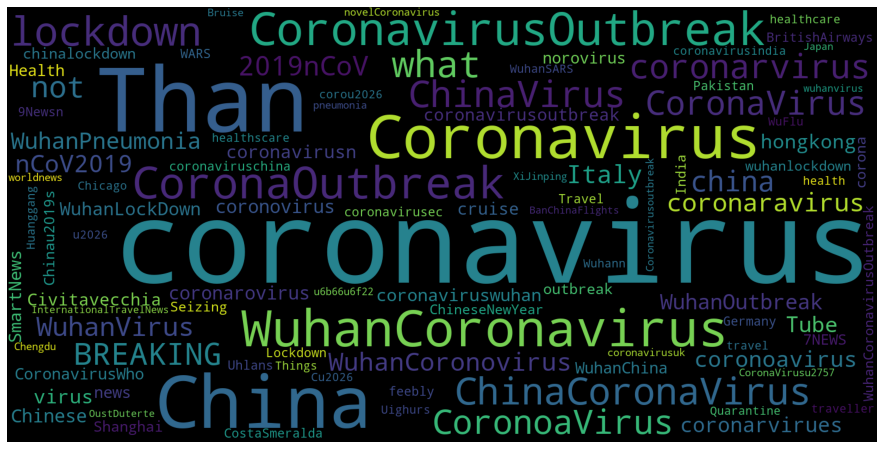

In [0]:
cloud(" ".join(hashtags))

## Análisis de sentimientos

Para llevar a cabo el análisis de sentimientos sin tener tweets categorizados, utilizamos una biblioteca NLTK (Natural Language ToolKit) - TextBlob que permite obtener en dos escalas los niveles de subjetividad y polaridad. Y posteriomente hemos categorizado los tweets en Positivo, Negativo, Neutro.



In [0]:
def getSubjectivity(text):
   return TextBlob(text).sentiment.subjectivity

def getPolarity(text):
   return  TextBlob(text).sentiment.polarity

def getAnalysis(score):
  if score < 0:
    return 'Negative'
  elif score == 0:
    return 'Neutral'
  else:
    return 'Positive'

In [0]:
df['Subjectivity'] = df['Tweets'].apply(getSubjectivity)
df['Polarity'] = df['Tweets'].apply(getPolarity)
df['Analysis'] = df['Polarity'].apply(getAnalysis)

## Positivos y Negativos

Abajo listamos los tweets negativos y positivos

In [0]:
print('Printing positive tweets:\n')
j=1
sortedDF = df.sort_values(by=['Polarity']) #Sort the tweets
for i in range(0, sortedDF.shape[0] ):
  if( sortedDF['Analysis'][i] == 'Positive'):
    print(str(j) + ') '+ sortedDF['Tweets'][i])
    print()
    j= j+1

Streaming output truncated to the last 5000 lines.

15437) @XRebellionUK I just got in England from China. I thrive on social situations and interactions. #chinalockdown couldn't hold me back, I'm kinda a rebel myself. Can I be part of the rebellion? I promise you won't even see me, but you'll be thinking of me. #toosoon

15438) RT @manyapan: How to survive staying indoors during #coronavirus lockdown according to these very important videos making their rounds on C\u2026

15439) It\u2019s Friday in Wuhan and I\u2019m stepping out for a while. We\u2019re a week into the lockdown, and in some ways the city \u2014 at least this part of it \u2014 feels more sci-fi deserted than ever. There\u2019s much more actual news on the Times\u2019 live briefing. https://t.co/r1surJCdNR https://t.co/y4xuN2JCWL

15440) It\u2019s Friday in Wuhan and I\u2019m stepping out for a while. We\u2019re a week into the lockdown, and in some ways the city \u2014 at least this part of it \u2014 feels more sci-fi 

In [0]:
print('Printing negative tweets:\n')
j=1
sortedDF = df.sort_values(by=['Polarity'],ascending=False) #Sort the tweets
for i in range(0, sortedDF.shape[0] ):
  if( sortedDF['Analysis'][i] == 'Negative'):
    print(str(j) + ') '+sortedDF['Tweets'][i])
    print()
    j=j+1

Streaming output truncated to the last 5000 lines.

11352) Forced to stay indoors, more than 40 million people have tuned in to the livestreams of two hospitals being built: Cement mixers become unlikely celebrities in #China #coronavirus lockdown https://t.co/Ja2e1FwylF

11353) Forced to stay indoors, more than 40 million people have tuned in to the livestreams of two hospitals being built: Cement mixers become unlikely celebrities in #China #coronavirus lockdown https://t.co/Ja2e1FwylF

11354) How to survive staying indoors during #coronavirus lockdown according to these very important videos making their rounds on Chinese social media. Firstly: don't be afraid to express your feelings and get in touch with your emotions. https://t.co/xd8yj73dtx

11355) Forced to stay indoors, more than 40 million people have tuned in to the livestreams of two hospitals being built: Cement mixers become unlikely celebrities in #China #coronavirus lockdown https://t.co/Ja2e1FwylF

11356) Forced to sta

## Grafico

En el grafico podemos ver la relacion que hay entre la subjectividad y la polaridad de algunos tweets (500).

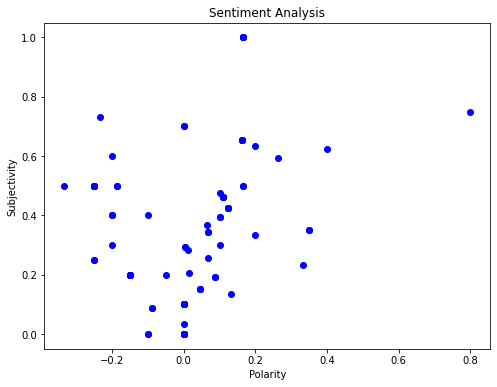

In [0]:
# Plotting 
plt.figure(figsize=(8,6)) 
for i in range(0, df.head(500).shape[0]):
  plt.scatter(df["Polarity"][i], df["Subjectivity"][i], color='Blue') 
# plt.scatter(x,y,color)   
plt.title('Sentiment Analysis') 
plt.xlabel('Polarity') 
plt.ylabel('Subjectivity') 
plt.show()

In [0]:
ptweets = df[df.Analysis == 'Positive']
ptweets = ptweets['Tweets']
ptweets

print("El percentage de tweets positivos: ")
round( (ptweets.shape[0] / df.shape[0]) * 100 , 1)

El percentage de tweets positivos: 


35.1

In [0]:
ntweets = df[df.Analysis == 'Negative']
ntweets = ntweets['Tweets']
ntweets
print("El percentage de tweets negativos: ")
round( (ntweets.shape[0] / df.shape[0]) * 100, 1)

El percentage de tweets negativos: 


27.1

In [0]:
print("El absoluto total de los tweets por categoria")
df['Analysis'].value_counts()

El absoluto total de los tweets por categoria


Neutral     19287
Positive    17935
Negative    13850
Name: Analysis, dtype: int64

Y por fim una grafica que enseña un grafico de barras con el recuento de tweets por categoria.

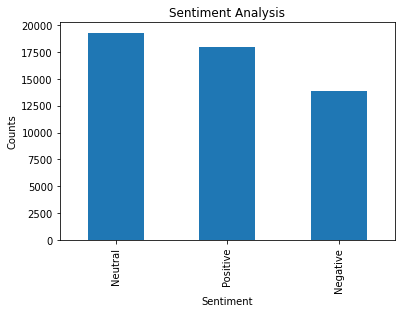

In [0]:
plt.title('Sentiment Analysis')
plt.xlabel('Sentiment')
plt.ylabel('Counts')
df['Analysis'].value_counts().plot(kind = 'bar')
plt.show()

## Languages

Ahora vamos enseñar la cantidad de diferentes lenguas que temos en twitter en estes datos de Covid 19, hemos filtrado solo los datos de lengua de los twwits em archivos .csv que vamos cargar en dataframes.

In [0]:
df_01_lang = pd.read_csv(r"drive/My Drive/UAM/web-mining/final-project/2020-01/lang.csv", encoding='utf-8', names=['Tweets'], header=None)
df_02_lang = pd.read_csv(r"drive/My Drive/UAM/web-mining/final-project/2020-02/lang.csv", encoding='utf-8', names=['Tweets'], header=None)
df_03_lang = pd.read_csv(r"drive/My Drive/UAM/web-mining/final-project/2020-03/lang.csv", encoding='utf-8', names=['Tweets'], header=None)

df_lang = pd.concat([df_01_lang, df_02_lang, df_03_lang])

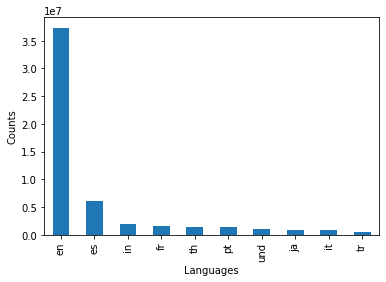

In [0]:
plt.title('Tweets por lengua')
plt.xlabel('Languages')
plt.ylabel('Counts')
df_lang['Tweets'].value_counts()[0:10].plot(kind = 'bar')
plt.show()

# Geoprocessamento

En esta etapa hemos hecho el mapeo del sentimiento de las personas durante el Covid 19. Como ni todos los tweets son georeferenciados el numero general de tweets cae en mucho.

## Filtrando los datos

Para obtener los datos, utilizamos el comando [jq](https://stedolan.github.io/jq/), que permite realizar filtros en los datos en JSON utilizando la línea de comandos.

jq es un programa de línea de comandos que le permite filtrar información del archivo json de una manera simple, la estamos usando para obtener los tweets que tienen puntos. A continuación lo instalamos con el comando apt (herramientas de paquete avanzadas)

```
!apt-get install jq
```



En algunos momentos tuvimos problemas con algunos paquetes gz que estaban dañados, por eso los elimina del proceso de carga.

`!rm coronavirus-tweet-id-2020-01-27-18.jsonl.gz`

Para cada mes que tenemos, desde enero, febrero y marzo de 2020 ingresamos a las carpetas para generar el archivo con las coordenadas y el texto de los tweets.

```
%cd "/content/drive/My Drive/UAM/web-mining/final-project/2020-01/"
```

La descripción de los campos, geo y fulo_text, de la API Twiter se obtuvo leyendo la [documentación](https://developer.twitter.com/en/docs/tweets/data-dictionary/overview/geo-objects#coordinates).

El siguiente comando de shell es una canalización que le permite obtener tweets de archivos .gz, primero usamos zcat para obtener los datos, sin tener que descomprimir los archivos uno por uno.

Luego usamos jq para ver si el campo de coordenadas es válido, si es válido generamos una nueva línea en el formato [csv (valores separados por comas)](https://en.wikipedia.org/wiki/comma-separated_values ) Finalmente, los datos se escriben en el archivo tweets_geo_sample.csv.

```shell
!zcat *gz | jq -c 'select(.geo.coordinates)' | \ 
jq -r '[.geo.coordinates[0],.geo.coordinates[1],.full_text]|@tsv' \
 > tweets_geo_sample.csv
```

Aquí podemos ver el tamaño del archivo, es decir, cuánto ocupa en el disco.

```
!du -h tweets_geo_sample.csv

237K	/content/drive/My Drive/UAM/web-mining/final-project/tweets_geo_sample_jan.csv
```

Con el siguiente comando podemos ver un poco de cómo se estructuran los datos: `!head tweets_geo_sample.csv`

```
55.8333248	-4.4229313	#coronavirus  may be more contagious than initially thought\nSource: New Scientist https://t.co/VCx3NyWGvL
37.7929728	-122.3958528	Thoughts? San Francisco:: Coronavirus: Wuhan Airlift Of State Department Personnel Rerouted To Southern California https://t.co/PnaiZEZoOf #Local #News #SanFranciscoPeninsulaNews @HainesForSF 2020
37.00748198	-121.57053318	Wuhan Coronavirus Update: 44,000 Now Infected, Warn University of Hong Kong Researchers https://t.co/opaveIQMAc https://t.co/mLJDZwb6dn
30.5833	114.267	#MondayMotivation \n#coronavirus\n#cough\n.\n.\nWhat ever happened to #madcowdisease and #ebola\nI say bring back rickets \n\n.\n.\n#antivaxxantichrist \n#timetothinouttheherd\n#ImNotDeadYet \n.\n.\n.\n#gfys @ Wuhan, China https://t.co/4HysRAxkd4
52.232222	21.008333	#RT Coronavirus turns Wuhan into a ghost town after lockdown https://t.co/Z7VdgEX8Dk
10.9545	-63.8529	Days before I got infected with Coronavirus.\n\nNow, back in the row. en Porlamar https://t.co/A0oGPTw9rw
64.6656	-147.101	Back to adulthood. Got my Coronavirus bewitching broom on the wall.\n•\n#168ars @ Eielson Air Force Base, Alaska https://t.co/Vwd0TRdIII
40.7207559	-74.0007613	Worried about the Coronavirus?  https://t.co/2PCKflU0KN
45.48138889	9.17666667	#CoronavirusOutbreak in China:\n- 1,985 confirmed cases, including 10 in Hong Kong, Macao and Taiwan\n- 56 deaths\n- 49 cured\n- 2,684 suspected cases\n#coronavirus chinatownmilano chinadailynews who aimo_oculisti @… https://t.co/xzt2f6voST
6.4523777	7.4951738	Heavy fire outbreak in enugu, railway quarters https://t.co/H8ulS3fF75
```





## Cargando los datos

Cargamos los datos en formato csv:

In [0]:
df_01 = pd.read_csv("/content/drive/My Drive/UAM/web-mining/final-project/2020-01/tweets_geo_sample.csv", sep=r',', engine="python", encoding='utf-8', names=['latitude', 'longitude', 'text'], header=None)
df_02 = pd.read_csv("/content/drive/My Drive/UAM/web-mining/final-project/2020-02/tweets_geo_sample.csv", sep=r',', engine="python", encoding='utf-8', names=['latitude', 'longitude', 'text'], header=None)
df_03 = pd.read_csv("/content/drive/My Drive/UAM/web-mining/final-project/2020-03/tweets_geo_sample.csv", sep=r',', engine="python", encoding='utf-8', names=['latitude', 'longitude', 'text'], header=None)

In [0]:
def sensibility_df(df):
  df['subjectivity'] = df['text'].apply(getSubjectivity)
  df['polarity'] = df['text'].apply(getPolarity)
  df['analysis'] = df['polarity'].apply(getAnalysis)
  return df[df.analysis == 'Positive'], df[df.analysis == 'Negative']

In [0]:
df_01_positive, df_01_negative = sensibility_df(df_01)
df_02_positive, df_02_negative = sensibility_df(df_02)
df_03_positive, df_03_negative = sensibility_df(df_03)
df = pd.concat([df_01, df_02, df_03])
df_positive, df_negative = sensibility_df(df)

In [0]:
!apt-get install libgeos-dev

Reading package lists... Done
Building dependency tree       
Reading state information... Done
Suggested packages:
  libgdal-doc
The following NEW packages will be installed:
  libgeos-dev
0 upgraded, 1 newly installed, 0 to remove and 32 not upgraded.
Need to get 73.1 kB of archives.
After this operation, 486 kB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 libgeos-dev amd64 3.6.2-1build2 [73.1 kB]
Fetched 73.1 kB in 0s (907 kB/s)
Selecting previously unselected package libgeos-dev.
(Reading database ... 144467 files and directories currently installed.)
Preparing to unpack .../libgeos-dev_3.6.2-1build2_amd64.deb ...
Unpacking libgeos-dev (3.6.2-1build2) ...
Setting up libgeos-dev (3.6.2-1build2) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...


In [0]:
!pip install https://github.com/matplotlib/basemap/archive/master.zip

     | 196.6MB 418kB/s
     |████████████████████████████████| 10.9MB 8.6MB/s 
     |████████████████████████████████| 225kB 55.3MB/s 
  Created wheel for basemap: filename=basemap-1.2.1-cp36-cp36m-linux_x86_64.whl size=121756029 sha256=9afa7d2c8efdd3538c9f5d2ba7819a16d441401b913a2d83111f47fb2645da9e
  Stored in directory: /tmp/pip-ephem-wheel-cache-0410on9g/wheels/98/4a/fc/ce719b75d97e646645c225f3332b1b217536100314922e9572
  Created wheel for pyshp: filename=pyshp-2.1.0-cp36-none-any.whl size=32609 sha256=914b27c99b35dc6afca89abdb37907f0ef6a390a281397e4aa87ca0dfbb4df7c
  Stored in directory: /root/.cache/pip/wheels/a6/0c/de/321b5192ad416b328975a2f0385f72c64db4656501eba7cc1a
Successfully built basemap pyshp


In [0]:
from mpl_toolkits.basemap import Basemap

## Mapa sentimentalidad España

A continuación podemos ver el mapa de España con tweets georreferenciados para los meses de enero, febrero y marzo. Tenga en cuenta que solo en marzo hay más tweets sobre Covid 19. El ultimo imagen tiene todos los tweets georreferenciados para España.


In [0]:
def map(df_positive, df_negative):
  map = Basemap(llcrnrlon=-10.5,llcrnrlat=35,urcrnrlon=4.,urcrnrlat=44., resolution='i', lat_0 = 39.5, lon_0 = -3.25)
  map.drawmapboundary(fill_color='#4AA0EB')
  map.fillcontinents(color='#4E5055',lake_color='#4AA0EB')
  map.drawcountries()
  map.plot(df_positive.longitude, df_positive.latitude, 'ro', marker='D',color='lightgreen')
  map.plot(df_negative.longitude, df_negative.latitude, 'ro', marker='o',color='red')

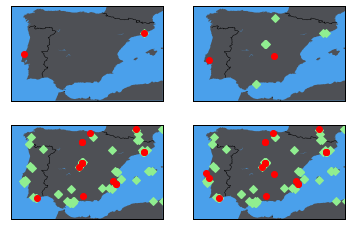

<Figure size 432x288 with 0 Axes>

In [0]:
plt.subplot(221)
map(df_01_positive, df_01_negative)
plt.subplot(222)
map(df_02_positive, df_02_negative)
plt.subplot(223)
map(df_03_positive, df_03_negative)
plt.subplot(224)
map(df_positive, df_negative)
plt.show()

## Mapa sentimentalidad Europa

Este mapa mostra los tweets georefenciados entre los meses de enero y marzo de 2020 con sentimento positivo o negativo para todos los paises del mundo con énfasis en los paises de Europa.



In [0]:
m = folium.Map(location=[45.5, 13.25], zoom_start=5, control_scale=True, tiles='Stamen Toner')

for id,item in df_positive.iterrows():
  marker = folium.Circle(
      radius=300,
      location=(item.latitude, item.longitude), 
      color='#3186cc'
  ).add_to(m)

for id,item in df_negative.iterrows():
  marker = folium.Circle(
      radius=300,
      location=(item.latitude, item.longitude), 
      color='crimson'
  ).add_to(m)

m

### Desempleo EEUU y Sentimentalidad Covid 19

La idea aquí es hacer correlaciones, en este caso estamos usando datos de los EE. UU. Como ejemplo, inicialmente tratamos de encontrar datos para otros países como España y Perú, pero no pudimos encontrar fuentes de datos confiables y más completas.

In [0]:
url = 'https://raw.githubusercontent.com/python-visualization/folium/master/examples/data'
state_geo = f'{url}/us-states.json'
state_unemployment = f'https://raw.githubusercontent.com/cabelotaina/COVID-19-TweetIDs/master/US_Unemployment_Oct2020.csv'
state_data = pd.read_csv(state_unemployment)

m = folium.Map(location=[48, -102], zoom_start=3)

folium.Choropleth(
    geo_data=state_geo,
    name='EEUU',
    data=state_data,
    columns=['State', 'Unemployment'],
    key_on='feature.id',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.2,
    legend_name='Unemployment Rate (%)'
).add_to(m)

for id,item in df_positive.iterrows():
  marker = folium.Circle(
      radius=300,
      location=(item.latitude, item.longitude), 
      color='#3186cc'
  ).add_to(m)

for id,item in df_negative.iterrows():
  marker = folium.Circle(
      radius=300,
      location=(item.latitude, item.longitude), 
      color='crimson'
  ).add_to(m)

folium.LayerControl().add_to(m)

m

# Bibliografia

https://ieee-dataport.org/open-access/coronavirus-covid-19-tweets-dataset, 
Coronavirus (COVID-19) Tweets Dataset, Accedido 15/05/2020.

https://live.rlamsal.com.np, Live Twitter Sentiment, Accedido 15/05/2020

https://web.stanford.edu/class/cs124/lec/semlec.pdf, Word Meaning and
Similarity Accedido 15/05/2020

https://dl.acm.org/doi/pdf/10.1145/3106426.3117760?download=true, A Methodology for Community Detection in Twitter, accedido 16/06/2020.

https://python-visualization.github.io/folium/quickstart.html#Vincent/Vega-and-Altair/VegaLite-Markers

Folium documentation Quickstart, https://python-visualization.github.io/folium/quickstart.html#Choropleth-maps

Como utilizar la libreria Basemap para hacer mapas, Documentacion Basemap https://basemaptutorial.readthedocs.io/en/latest/backgrounds.html

Desempleo EEUU por provincia, U.S. BUREAU OF LABOR STATISTICS, 31 Mayo de 2020 https://www.bls.gov/web/laus/laumstrk.htm#laumstrk.f.p

https://textblob.readthedocs.io/en/dev/quickstart.html#sentiment-analysis

https://textblob.readthedocs.io/en/dev/advanced_usage.html#advanced

https://medium.com/@rafael.fabri.chimidt/como-fazer-um-wordcloud-em-python-917516141252

https://amueller.github.io/word_cloud/generated/wordcloud.WordCloud.html

https://programminghistorian.org/en/lessons/counting-frequencies

https://www.earthdatascience.org/courses/use-data-open-source-python/intro-to-apis/calculate-tweet-word-frequencies-in-python/